In [2]:
from model import BasicModel, InverseModel, SuperModel, RSIModel
import pandas as pd
import numpy as np
from datetime import datetime

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor

import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import pandas_datareader as pdr

import seaborn as sns

plt.style.use("fivethirtyeight")
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [3]:
#chargement dataset nasdaq
start_date = '1998-01-01'
end_date = datetime.now()
df = pdr.DataReader('^NDX', 'yahoo', start_date, end_date)

#on passe l'index Date en colomne
df = df.rename_axis('Date').reset_index()

#delete Adj Close (pareil que Close)
df = df.drop('Adj Close', 1)

In [4]:
df.head()

,Date,High,Low,Open,Close,Volume
0,1998-01-02,1008.229980,987.719971,990.799988,1008.229980,434140000
1,1998-01-05,1028.619995,1007.250000,1008.229980,1017.419983,681560000
2,1998-01-06,1018.219971,1001.940002,1017.419983,1006.289978,635700000
3,1998-01-07,1006.289978,978.700012,1006.289978,991.190002,691340000
4,1998-01-08,1003.710022,982.270020,990.969971,994.549988,645050000


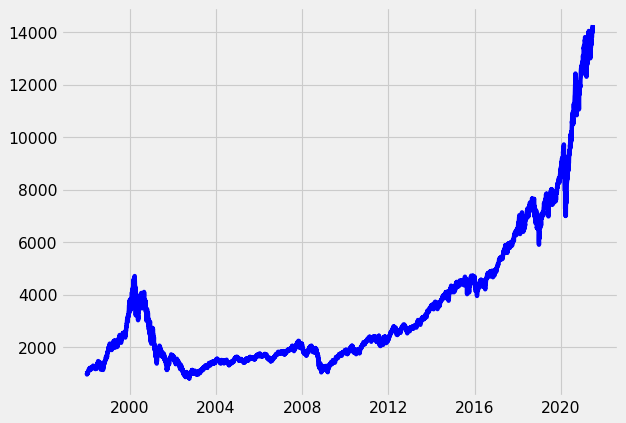

In [5]:
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(df.Date, df.Close, color="b")

<h1>Partie 1 : Moyenne mobile prix du cours</h1>

In [6]:
#on créé les columns (différentes pour chaque modèle)
indicator, activity, portefeuille, portefeuille_frais = "MM_indicator", "MM_acivity", "MM_pf", "MM_pf_frais"
df[indicator], df[activity], df[portefeuille], df[portefeuille_frais] = 0,0,0,0

In [7]:
#indicateur MM100
df[indicator] = df.Close.rolling(window=150).mean()

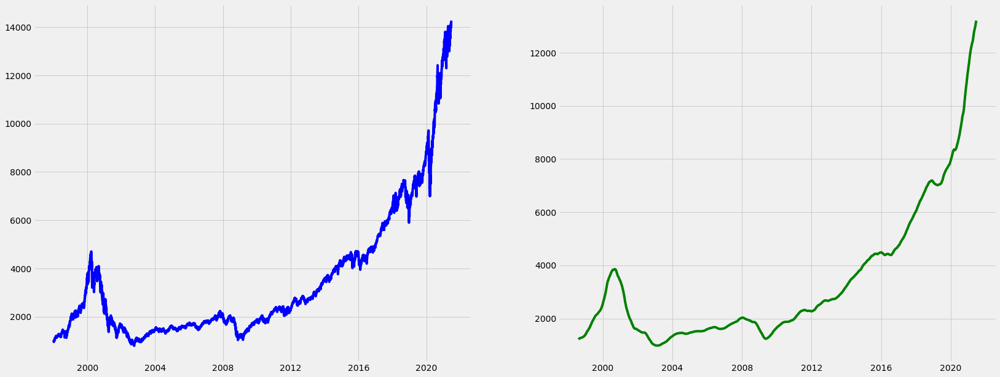

In [599]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(25, 10))
ax1.plot(df.Date, df.Close, color="b")
ax2.plot(df.Date, df[indicator], color="g")
plt.show()

In [8]:
model_mm100 = BasicModel(df, indicator, activity, portefeuille, portefeuille_frais, frais = 2.5)

1998-10-08 00:00:00 || GO SELL || 193 || 1128.8800048828125 || 1128.8800048828125 || 1126.3800048828125
1998-10-09 00:00:00 || GO BUY || 194 || 1197.8699951171875|| 1128.8800048828125 || 1123.8800048828125

2000-07-28 00:00:00 || GO SELL || 648 || 3477.31005859375 || 3277.0382528367236 || 3260.023697531191
2000-07-31 00:00:00 || GO BUY || 649 || 3609.35009765625|| 3277.0382528367236 || 3257.523697531191

2000-08-01 00:00:00 || GO SELL || 650 || 3521.14990234375 || 3196.958624613787 || 3175.4209384239716
2000-08-08 00:00:00 || GO BUY || 655 || 3686.3701171875|| 3196.958624613787 || 3172.9209384239716

2000-09-08 00:00:00 || GO SELL || 677 || 3813.43994140625 || 3307.158348881905 || 3279.792079434939
2001-11-09 00:00:00 || GO BUY || 969 || 1514.9599609375|| 3307.158348881905 || 3277.292079434939

2001-11-16 00:00:00 || GO SELL || 974 || 1582.1400146484375 || 3453.8124395754794 || 3420.1217670833325
2002-04-18 00:00:00 || GO BUY || 1077 || 1395.9000244140625|| 3453.8124395754794 || 3417.6

2011-08-04 00:00:00 || GO SELL || 3419 || 2207.199951171875 || 6514.119264118479 || 6153.81625303894
2011-10-12 00:00:00 || GO BUY || 3467 || 2307.179931640625|| 6514.119264118479 || 6151.31625303894

2011-11-01 00:00:00 || GO SELL || 3481 || 2298.3701171875 || 6489.245529194129 || 6125.327857492248
2011-11-03 00:00:00 || GO BUY || 3483 || 2367.7099609375|| 6489.245529194129 || 6122.827857492248

2011-11-09 00:00:00 || GO SELL || 3487 || 2314.10009765625 || 6342.315554088219 || 5981.694338290082
2011-11-11 00:00:00 || GO BUY || 3489 || 2355.780029296875|| 6342.315554088219 || 5979.194338290082

2011-11-17 00:00:00 || GO SELL || 3493 || 2272.090087890625 || 6117.002489837473 || 5764.2812871541355
2012-01-04 00:00:00 || GO BUY || 3524 || 2329.7099609375|| 6117.002489837473 || 5761.7812871541355

2012-10-19 00:00:00 || GO SELL || 3725 || 2678.320068359375 || 7032.330548195432 || 6621.45521744367
2012-11-28 00:00:00 || GO BUY || 3750 || 2665.27001953125|| 7032.330548195432 || 6618.95521744

In [601]:
df[185:200]

,Date,High,Low,Open,Close,Volume,MM_indicator,MM_acivity,MM_pf,MM_pf_frais
185,1998-09-28,1413.160034,1367.739990,1390.089966,1383.250000,696680000,1273.875597,1,1383.250000,1383.250000
186,1998-09-29,1400.390015,1369.040039,1383.300049,1384.890015,781710000,1275.105597,1,1384.890015,1384.890015
187,1998-09-30,1384.439941,1343.599976,1384.439941,1345.479980,737760000,1276.028997,1,1345.479980,1345.479980
188,1998-10-01,1345.479980,1266.380005,1345.479980,1273.739990,856960000,1276.559731,1,1273.739990,1273.739990
189,1998-10-02,1285.689941,1228.699951,1273.739990,1276.439941,871450000,1277.218730,1,1276.439941,1276.439941
190,1998-10-05,1267.489990,1174.939941,1267.489990,1207.680054,877180000,1277.431798,1,1207.680054,1207.680054
191,1998-10-06,1250.400024,1174.400024,1207.680054,1184.839966,887180000,1277.464931,1,1184.839966,1184.839966
192,1998-10-07,1204.869995,1139.339966,1184.099976,1151.089966,940230000,1277.626664,1,1151.089966,1151.089966
193,1998-10-08,1144.689941,1063.270020,1144.689941,1128.880005,1209510000,1277.398464,0,1128.880005,1126.380005
194,1998-10-09,1199.130005,1128.880005,1128.880005,1197.869995,892830000,1277.861798,1,1128.880005,1123.880005


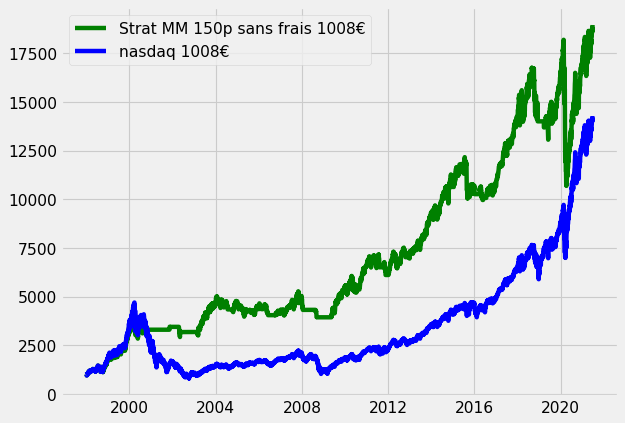

In [602]:
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(df['Date'], df[portefeuille], color="g", label="Strat MM 150p sans frais 1008€")
#plt.plot(df['Date'], df[portefeuille_frais], color="r", label="Strat MM 150p avec frais 1008€")
plt.plot(df['Date'], df.Close, color="b", label="nasdaq 1008€")
plt.legend(loc="upper left")
plt.show()

In [9]:
model_mm100.stats(portefeuille, portefeuille_frais)

Départ : 1008€

Stratégie sans frais final : 18956€
Stratégie avec frais final: 17635€
Sans stratégie final: 14270€

Total frais: 345€
Total transactions: 138


<h1>Partie 2 : Moyenne mobile de 3 GAFAS</h1>

In [10]:
#on créé les columns (différentes pour chaque modèle)
indicator, activity, portefeuille, portefeuille_frais = "GAFA_indicator", "GAFA_acivity", "GAFA_pf", "GAFA_pf_frais"
df[indicator], df[activity], df[portefeuille], df[portefeuille_frais] = 0,0,0,0

In [11]:
#viz
tech_list = ['AAPL','MSFT', 'AMZN']

end = datetime.now()
start = '1998-01-01'

for stock in tech_list:   
    globals()[stock] = pdr.DataReader(stock, 'yahoo', start, end)



company_list = [AAPL, MSFT, AMZN]
company_name = ["APPLE", "MICROSOFT", "AMAZON"]

for company, com_name in zip(company_list, company_name):
    company["company_name"] = com_name
    
# df = pd.concat(company_list, axis=0)  ne pas toucher au df car on l'utilise tous pour nos modèles

/home/adrienfontaine/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:331: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():
/home/adrienfontaine/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/tools.py:331: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():


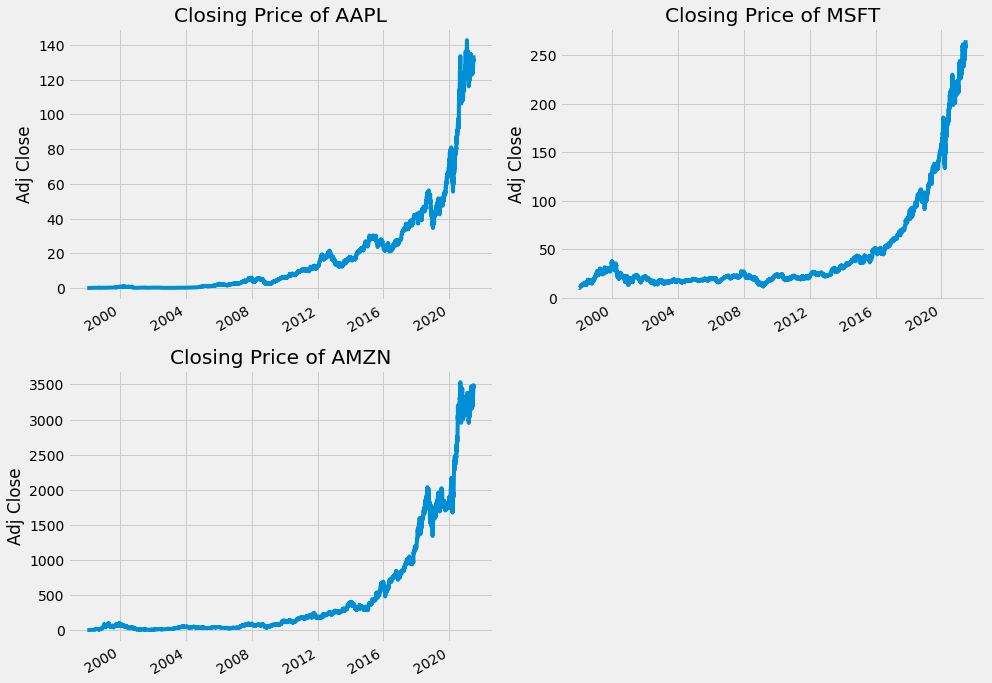

In [606]:
plt.figure(figsize=(14, 14))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, company in enumerate(company_list, 1):
    plt.subplot(3,2, i)
    company['Adj Close'].plot()
    plt.ylabel('Adj Close')
    plt.xlabel(None)
    plt.title(f"Closing Price of {tech_list[i - 1]}")
    
plt.tight_layout()


In [12]:
ma_day = [20, 50, 100]

for ma in ma_day:
    for company in company_list:
        column_name = f"MA for {ma} days"
        company[column_name] = company['Adj Close'].rolling(ma).mean()

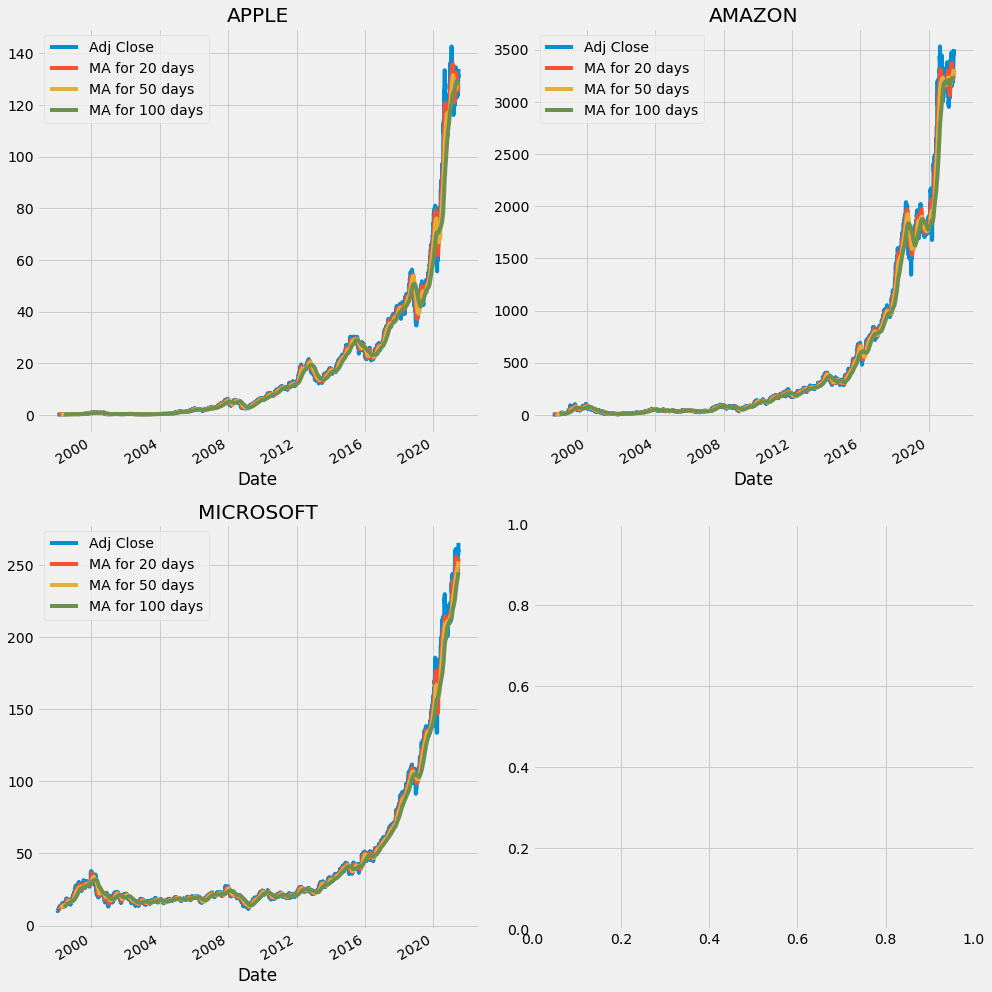

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=2)
fig.set_figheight(14)
fig.set_figwidth(14)

AAPL[['Adj Close', 'MA for 20 days', 'MA for 50 days', 'MA for 100 days']].plot(ax=axes[0,0])
axes[0,0].set_title('APPLE')

MSFT[['Adj Close', 'MA for 20 days', 'MA for 50 days', 'MA for 100 days']].plot(ax=axes[1,0])
axes[1,0].set_title('MICROSOFT')

AMZN[['Adj Close', 'MA for 20 days', 'MA for 50 days', 'MA for 100 days']].plot(ax=axes[0,1])
axes[0,1].set_title('AMAZON')


fig.tight_layout()

In [14]:
#indicateur moyenne mobile des GAFAS
#calculs moyennes mobiles qu'on met sous la même echelle
df_mm_gafam = df
df_mm_gafam['AAPL'] = AAPL.reset_index().Close.rolling(window=150).mean()/AAPL.Close.values[-1]
df_mm_gafam['MSFT'] = MSFT.reset_index().Close.rolling(window=150).mean()/MSFT.Close.values[-1]
df_mm_gafam['AMZN'] = AMZN.reset_index().Close.rolling(window=150).mean()/AMZN.Close.values[-1]

#sommes des moyennes
df[indicator] = df_mm_gafam['AMZN'] +df_mm_gafam['MSFT'] + df_mm_gafam['AAPL']


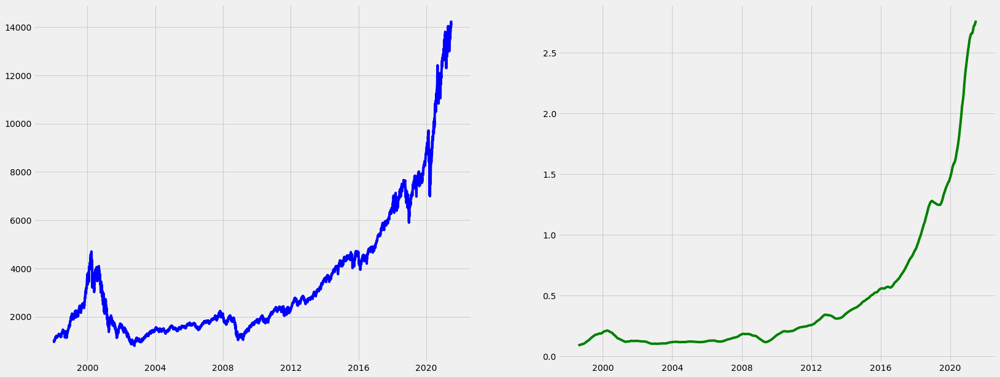

In [15]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(25, 10))
ax1.plot(df.Date, df.Close, color="b")
ax2.plot(df.Date, df[indicator], color="g")
plt.show()

In [16]:
model_gafas = BasicModel(df, indicator, activity, portefeuille, portefeuille_frais, frais = 2.5)

1999-11-01 00:00:00 || GO SELL || 461 || 2616.360107421875 || 2616.360107421875 || 2613.860107421875
1999-11-02 00:00:00 || GO BUY || 462 || 2626.989990234375|| 2616.360107421875 || 2611.360107421875

1999-11-03 00:00:00 || GO SELL || 463 || 2672.719970703125 || 2661.905045566441 || 2654.3180068250704
1999-11-15 00:00:00 || GO BUY || 471 || 2875.8701171875|| 2661.905045566441 || 2651.8180068250704

1999-11-16 00:00:00 || GO SELL || 472 || 2940.25 || 2721.4950576004917 || 2708.6822081146743
1999-11-18 00:00:00 || GO BUY || 474 || 3003.489990234375|| 2721.4950576004917 || 2706.1822081146743

2000-02-18 00:00:00 || GO SELL || 537 || 3965.75 || 3593.409353708866 || 3570.690563885748
2000-02-22 00:00:00 || GO BUY || 538 || 3969.1298828125|| 3593.409353708866 || 3568.190563885748

2000-04-04 00:00:00 || GO SELL || 568 || 4034.169921875 || 3652.292658522054 || 3624.160621684191
2001-05-01 00:00:00 || GO BUY || 838 || 1919.010009765625|| 3652.292658522054 || 3621.660621684191

2001-06-11 00:00


2004-08-04 00:00:00 || GO SELL || 1655 || 1379.2099609375 || 2550.480291050471 || 2341.1548823418725
2004-09-09 00:00:00 || GO BUY || 1680 || 1391.530029296875|| 2550.480291050471 || 2338.6548823418725

2004-11-26 00:00:00 || GO SELL || 1735 || 1578.260009765625 || 2892.7302784075027 || 2649.9799319697986
2004-11-29 00:00:00 || GO BUY || 1736 || 1580.43994140625|| 2892.7302784075027 || 2647.4799319697986

2005-01-18 00:00:00 || GO SELL || 1770 || 1573.489990234375 || 2880.009558270268 || 2633.3376950371276
2005-07-28 00:00:00 || GO BUY || 1903 || 1618.6400146484375|| 2880.009558270268 || 2630.8376950371276

2005-07-29 00:00:00 || GO SELL || 1904 || 1605.1400146484375 || 2855.9893136916157 || 2606.3956272755595
2005-08-01 00:00:00 || GO BUY || 1905 || 1610.1099853515625|| 2855.9893136916157 || 2603.8956272755595

2006-04-28 00:00:00 || GO SELL || 2092 || 1700.7099609375 || 3016.694212393093 || 2747.91535723549
2006-09-15 00:00:00 || GO BUY || 2189 || 1632.43994140625|| 3016.69421239309

2018-12-14 00:00:00 || GO SELL || 5272 || 6594.9599609375 || 9131.995370743713 || 7920.917693997913
2019-01-30 00:00:00 || GO BUY || 5302 || 6807.91015625|| 9131.995370743713 || 7918.417693997913

2019-01-31 00:00:00 || GO SELL || 5303 || 6906.83984375 || 9264.697687246779 || 8030.984810041229
2019-02-05 00:00:00 || GO BUY || 5306 || 7023.52001953125|| 9264.697687246779 || 8028.484810041229

2019-02-06 00:00:00 || GO SELL || 5307 || 6997.6201171875 || 9230.533227734059 || 7996.379003840049
2019-04-23 00:00:00 || GO BUY || 5359 || 7810.7099609375|| 9230.533227734059 || 7993.879003840049

2019-05-02 00:00:00 || GO SELL || 5366 || 7724.06005859375 || 9128.132190342589 || 7902.697073708905
2019-05-03 00:00:00 || GO BUY || 5367 || 7845.72998046875|| 9128.132190342589 || 7900.197073708905

2019-05-07 00:00:00 || GO SELL || 5369 || 7640.14990234375 || 8888.949586111052 || 7690.689805340113
2019-05-16 00:00:00 || GO BUY || 5376 || 7580.14013671875|| 8888.949586111052 || 7688.189805340113

2019

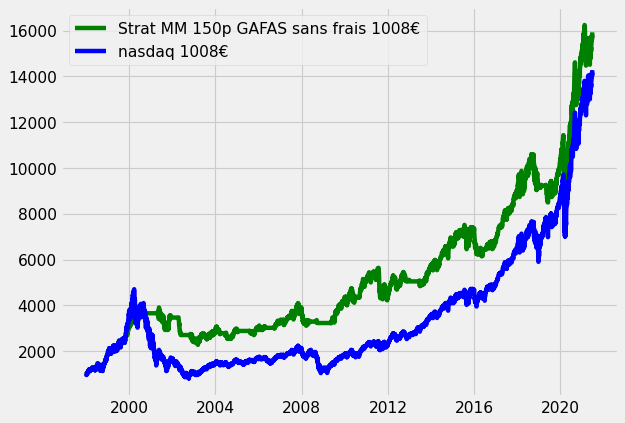

In [612]:
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(df['Date'], df[portefeuille], color="g", label="Strat MM 150p GAFAS sans frais 1008€")
#plt.plot(df['Date'], df[portefeuille_frais], color="r", label="Strat MM 150p GAFAS avec frais 1008€")
plt.plot(df['Date'], df.Close, color="b", label="nasdaq 1008€")
plt.legend(loc="upper left")
plt.show()

In [17]:
model_gafas.stats(portefeuille, portefeuille_frais)

Départ : 1008€

Stratégie sans frais final : 15926€
Stratégie avec frais final: 13751€
Sans stratégie final: 14270€

Total frais: 475€
Total transactions: 190


<h1>Partie 3 : Moyenne mobile du volume</h1>

In [18]:
#on créé les columns (différentes pour chaque modèle)
indicator, activity, portefeuille, portefeuille_frais = "vol_indicator", "vol_acivity", "vol_pf", "vol_pf_frais"
df[indicator], df[activity], df[portefeuille], df[portefeuille_frais] = 0,0,0,0

In [19]:
#indicateur VIX100
df[indicator] = df.Volume.rolling(window=110).mean()

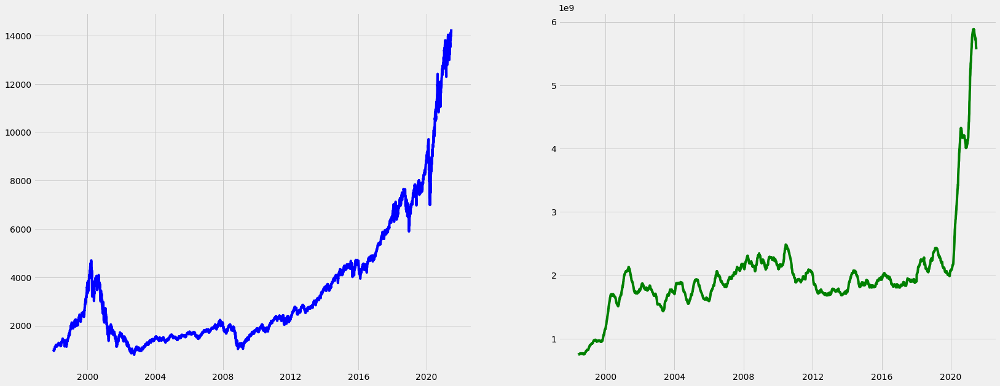

In [616]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(25, 10))
ax1.plot(df.Date, df.Close, color="b")
ax2.plot(df.Date, df[indicator], color="g")
plt.show()

In [20]:
model_volume = InverseModel(df, indicator, activity, portefeuille, portefeuille_frais, frais = 2.5)

1998-06-11 00:00:00 || GO SELL || 110 || 1185.1099853515625 || 1185.1099853515625 || 1182.6099853515625
1998-06-15 00:00:00 || GO BUY || 112 || 1173.5699462890625|| 1185.1099853515625 || 1180.1099853515625

1998-06-17 00:00:00 || GO SELL || 114 || 1224.0799560546875 || 1236.1166740646893 || 1228.40147594239
1998-06-18 00:00:00 || GO BUY || 115 || 1227.3299560546875|| 1236.1166740646893 || 1225.90147594239

1998-06-19 00:00:00 || GO SELL || 116 || 1239.7099609375 || 1248.5853100538568 || 1235.767071830557
1998-06-22 00:00:00 || GO BUY || 117 || 1263.9300537109375|| 1248.5853100538568 || 1233.267071830557

1998-06-23 00:00:00 || GO SELL || 118 || 1302.3900146484375 || 1286.5783478100348 || 1268.2939929357622
1998-06-26 00:00:00 || GO BUY || 121 || 1320.93994140625|| 1286.5783478100348 || 1265.7939929357622

1998-06-30 00:00:00 || GO SELL || 123 || 1337.3399658203125 || 1302.5517586013127 || 1279.009357227965
1998-07-10 00:00:00 || GO BUY || 130 || 1391.1099853515625|| 1302.5517586013127 

1999-10-11 00:00:00 || GO BUY || 446 || 2578.8798828125|| 1946.050286470495 || 1637.5843185244012

1999-10-12 00:00:00 || GO SELL || 447 || 2526.820068359375 || 1906.765394798993 || 1602.0264253119603
1999-10-18 00:00:00 || GO BUY || 451 || 2362.110107421875|| 1906.765394798993 || 1599.5264253119603

1999-10-19 00:00:00 || GO SELL || 452 || 2362.25 || 1906.87832024058 || 1597.1211549669044
1999-10-25 00:00:00 || GO BUY || 456 || 2484.18994140625|| 1906.87832024058 || 1594.6211549669044

1999-10-26 00:00:00 || GO SELL || 457 || 2466.39990234375 || 1893.2225851298779 || 1580.7015883049883
1999-11-01 00:00:00 || GO BUY || 461 || 2616.360107421875|| 1893.2225851298779 || 1578.2015883049883

1999-11-02 00:00:00 || GO SELL || 462 || 2626.989990234375 || 1900.9144675128957 || 1582.1135871313709
1999-11-26 00:00:00 || GO BUY || 479 || 3116.6201171875|| 1900.9144675128957 || 1579.6135871313709

1999-11-29 00:00:00 || GO SELL || 480 || 3063.22998046875 || 1868.3503180512828 || 1550.0535726898786

2001-08-30 00:00:00 || GO SELL || 923 || 1453.9000244140625 || 1542.212893351464 || 1123.3754383177818
2001-08-31 00:00:00 || GO BUY || 924 || 1469.699951171875|| 1542.212893351464 || 1120.8754383177818

2001-09-19 00:00:00 || GO SELL || 932 || 1208.22998046875 || 1267.8423596101643 || 918.9638048172724
2001-09-24 00:00:00 || GO BUY || 935 || 1191.02001953125|| 1267.8423596101643 || 916.4638048172724

2001-09-25 00:00:00 || GO SELL || 936 || 1187.77001953125 || 1264.3827303838186 || 911.4630010383163
2001-09-28 00:00:00 || GO BUY || 939 || 1168.3699951171875|| 1264.3827303838186 || 908.9630010383163

2001-10-03 00:00:00 || GO SELL || 942 || 1249.4100341796875 || 1352.0823685878772 || 969.5101499880152
2001-10-05 00:00:00 || GO BUY || 944 || 1271.72998046875|| 1352.0823685878772 || 967.0101499880152

2001-10-11 00:00:00 || GO SELL || 948 || 1389.8699951171875 || 1477.686886279588 || 1054.3425790722638
2001-10-12 00:00:00 || GO BUY || 949 || 1393.8399658203125|| 1477.686886279588 || 1051

2002-12-10 00:00:00 || GO SELL || 1241 || 1033.0699462890625 || 1332.7641826875815 || 773.2593121396603
2002-12-11 00:00:00 || GO BUY || 1242 || 1036.3399658203125|| 1332.7641826875815 || 770.7593121396603

2003-01-07 00:00:00 || GO SELL || 1259 || 1071.8499755859375 || 1378.4311169981293 || 794.6692467206947
2003-01-08 00:00:00 || GO BUY || 1260 || 1042.52001953125|| 1378.4311169981293 || 792.1692467206947

2003-01-09 00:00:00 || GO SELL || 1261 || 1076.050048828125 || 1422.7648802552155 || 815.1473742894786
2003-01-13 00:00:00 || GO BUY || 1263 || 1083.0|| 1422.7648802552155 || 812.6473742894786

2003-01-16 00:00:00 || GO SELL || 1266 || 1061.4599609375 || 1394.4671784108477 || 793.9844415228735
2003-01-21 00:00:00 || GO BUY || 1268 || 1008.9299926757812|| 1394.4671784108477 || 791.4844415228735

2003-01-24 00:00:00 || GO SELL || 1271 || 996.1799926757812 || 1376.8450870330453 || 778.9823336435616
2003-01-27 00:00:00 || GO BUY || 1272 || 986.4099731445312|| 1376.8450870330453 || 776.

2005-12-12 00:00:00 || GO BUY || 1998 || 1698.3499755859375|| 1991.4109358729136 || 616.8013347381138

2005-12-13 00:00:00 || GO SELL || 1999 || 1705.77001953125 || 2000.1113550266602 || 616.9961226646749
2005-12-14 00:00:00 || GO BUY || 2000 || 1698.97998046875|| 2000.1113550266602 || 614.4961226646749

2005-12-15 00:00:00 || GO SELL || 2001 || 1701.699951171875 || 2003.3134200016455 || 612.9798961464381
2005-12-19 00:00:00 || GO BUY || 2003 || 1664.3599853515625|| 2003.3134200016455 || 610.4798961464381

2005-12-20 00:00:00 || GO SELL || 2004 || 1665.0699462890625 || 2004.1679672668336 || 608.2403066845475
2005-12-22 00:00:00 || GO BUY || 2006 || 1683.3499755859375|| 2004.1679672668336 || 605.7403066845475

2006-01-03 00:00:00 || GO SELL || 2012 || 1679.9300537109375 || 2000.0962662112972 || 602.0096745786607
2006-02-24 00:00:00 || GO BUY || 2048 || 1676.5|| 2000.0962662112972 || 599.5096745786607

2006-02-27 00:00:00 || GO SELL || 2049 || 1695.6600341796875 || 2022.954550030727 || 6

2007-12-28 00:00:00 || GO BUY || 2512 || 2107.050048828125|| 2502.9084302812107 || 354.05042533592433

2008-01-04 00:00:00 || GO SELL || 2516 || 1963.52001953125 || 2332.4129451239137 || 327.43288339652
2008-01-07 00:00:00 || GO BUY || 2517 || 1957.43994140625|| 2332.4129451239137 || 324.93288339652

2008-01-09 00:00:00 || GO SELL || 2519 || 1949.199951171875 || 2322.594477908749 || 321.06505405505317
2008-01-11 00:00:00 || GO BUY || 2521 || 1912.81005859375|| 2322.594477908749 || 318.56505405505317

2008-01-18 00:00:00 || GO SELL || 2526 || 1844.0899658203125 || 2239.1523675539424 || 304.6202062142108
2008-01-24 00:00:00 || GO BUY || 2529 || 1826.9200439453125|| 2239.1523675539424 || 302.1202062142108

2008-01-25 00:00:00 || GO SELL || 2530 || 1789.1700439453125 || 2192.8843318206327 || 293.377438326046
2008-03-26 00:00:00 || GO BUY || 2571 || 1817.280029296875|| 2192.8843318206327 || 290.877438326046

2008-04-01 00:00:00 || GO SELL || 2575 || 1855.47998046875 || 2238.979635269011 || 

2009-07-07 00:00:00 || GO BUY || 2894 || 1404.780029296875|| 2410.000504768307 || 48.313035486960814

2009-07-08 00:00:00 || GO SELL || 2895 || 1411.530029296875 || 2421.5806120220586 || 46.045180721613825
2009-07-09 00:00:00 || GO BUY || 2896 || 1414.97998046875|| 2421.5806120220586 || 43.545180721613825

2009-07-15 00:00:00 || GO SELL || 2900 || 1500.97998046875 || 2568.7600318785194 || 43.691780386450205
2009-07-16 00:00:00 || GO BUY || 2901 || 1518.8699951171875|| 2568.7600318785194 || 41.191780386450205

2009-07-23 00:00:00 || GO SELL || 2906 || 1601.52001953125 || 2708.5403159259686 || 40.93325046983027
2009-07-24 00:00:00 || GO BUY || 2907 || 1599.06005859375|| 2708.5403159259686 || 38.43325046983027

2009-07-27 00:00:00 || GO SELL || 2908 || 1599.31005859375 || 2708.9637741165116 || 35.93925919512225
2009-07-29 00:00:00 || GO BUY || 2910 || 1599.6099853515625|| 2708.9637741165116 || 33.43925919512225

2009-07-30 00:00:00 || GO SELL || 2911 || 1609.8699951171875 || 2726.33925628

2011-06-17 00:00:00 || GO SELL || 3386 || 2192.9599609375 || 4135.440167789184 || -2.5
2011-06-20 00:00:00 || GO BUY || 3387 || 2204.360107421875|| 4135.440167789184 || -2.5

2011-06-21 00:00:00 || GO SELL || 3388 || 2251.820068359375 || 4224.47635936325 || -2.5
2011-06-22 00:00:00 || GO BUY || 3389 || 2235.75|| 4224.47635936325 || -2.5

2011-06-23 00:00:00 || GO SELL || 3390 || 2255.050048828125 || 4260.944032407629 || -2.5
2011-06-27 00:00:00 || GO BUY || 3392 || 2252.239990234375|| 4260.944032407629 || -2.5

2011-07-15 00:00:00 || GO SELL || 3405 || 2356.669921875 || 4458.511829781901 || -2.5
2011-07-18 00:00:00 || GO BUY || 3406 || 2344.010009765625|| 4458.511829781901 || -2.5

2011-07-21 00:00:00 || GO SELL || 3409 || 2404.239990234375 || 4573.074514799746 || -2.5
2011-07-22 00:00:00 || GO BUY || 3410 || 2429.5|| 4573.074514799746 || -2.5

2011-07-27 00:00:00 || GO SELL || 3413 || 2367.159912109375 || 4455.731083154142 || -2.5
2011-07-28 00:00:00 || GO BUY || 3414 || 2371.77001953

2012-08-08 00:00:00 || GO SELL || 3674 || 2714.02001953125 || 5301.859747523753 || -2.5
2012-08-09 00:00:00 || GO BUY || 3675 || 2719.610107421875|| 5301.859747523753 || -2.5

2012-08-16 00:00:00 || GO SELL || 3680 || 2768.090087890625 || 5396.371110129206 || -2.5
2012-08-17 00:00:00 || GO BUY || 3681 || 2780.300048828125|| 5396.371110129206 || -2.5

2012-09-06 00:00:00 || GO SELL || 3694 || 2829.7099609375 || 5492.2723501314995 || -2.5
2012-09-07 00:00:00 || GO BUY || 3695 || 2825.110107421875|| 5492.2723501314995 || -2.5

2012-09-12 00:00:00 || GO SELL || 3698 || 2791.679931640625 || 5427.281031874191 || -2.5
2012-09-17 00:00:00 || GO BUY || 3701 || 2856.43994140625|| 5427.281031874191 || -2.5

2012-09-18 00:00:00 || GO SELL || 3702 || 2857.3798828125 || 5429.066935400909 || -2.5
2012-09-25 00:00:00 || GO BUY || 3707 || 2804.530029296875|| 5429.066935400909 || -2.5

2012-09-28 00:00:00 || GO SELL || 3710 || 2799.18994140625 || 5418.729483387105 || -2.5
2012-10-02 00:00:00 || GO BUY |

2013-11-07 00:00:00 || GO SELL || 3988 || 3321.409912109375 || 5968.849308940097 || -2.5
2013-11-11 00:00:00 || GO BUY || 3990 || 3362.97998046875|| 5968.849308940097 || -2.5

2013-11-12 00:00:00 || GO SELL || 3991 || 3365.22998046875 || 5972.842764453693 || -2.5
2013-11-25 00:00:00 || GO BUY || 4000 || 3427.489990234375|| 5972.842764453693 || -2.5

2013-12-02 00:00:00 || GO SELL || 4004 || 3481.14990234375 || 6066.352072634571 || -2.5
2013-12-04 00:00:00 || GO BUY || 4006 || 3483.010009765625|| 6066.352072634571 || -2.5

2013-12-05 00:00:00 || GO SELL || 4007 || 3477.72998046875 || 6057.155855403251 || -2.5
2013-12-24 00:00:00 || GO BUY || 4020 || 3572.800048828125|| 6057.155855403251 || -2.5

2014-01-03 00:00:00 || GO SELL || 4026 || 3538.72998046875 || 5999.395076396134 || -2.5
2014-02-28 00:00:00 || GO BUY || 4064 || 3696.10009765625|| 5999.395076396134 || -2.5

2014-03-03 00:00:00 || GO SELL || 4065 || 3668.3701171875 || 5954.384631901335 || -2.5
2014-03-18 00:00:00 || GO BUY || 4

2015-09-16 00:00:00 || GO SELL || 4454 || 4383.669921875 || 7306.008370452115 || -2.5
2015-09-23 00:00:00 || GO BUY || 4459 || 4273.52978515625|| 7306.008370452115 || -2.5

2015-09-24 00:00:00 || GO SELL || 4460 || 4261.10009765625 || 7284.758629492656 || -2.5
2015-10-01 00:00:00 || GO BUY || 4465 || 4192.9599609375|| 7284.758629492656 || -2.5

2015-10-02 00:00:00 || GO SELL || 4466 || 4267.4501953125 || 7414.176363678432 || -2.5
2015-10-06 00:00:00 || GO BUY || 4468 || 4306.7001953125|| 7414.176363678432 || -2.5

2015-10-07 00:00:00 || GO SELL || 4469 || 4333.4599609375 || 7460.244493057485 || -2.5
2015-10-09 00:00:00 || GO BUY || 4471 || 4370.009765625|| 7460.244493057485 || -2.5

2015-10-15 00:00:00 || GO SELL || 4475 || 4418.22021484375 || 7542.546766411917 || -2.5
2015-10-19 00:00:00 || GO BUY || 4477 || 4462.06982421875|| 7542.546766411917 || -2.5

2015-10-21 00:00:00 || GO SELL || 4479 || 4413.52001953125 || 7460.479657025132 || -2.5
2015-10-26 00:00:00 || GO BUY || 4482 || 4630

2017-11-03 00:00:00 || GO BUY || 4993 || 6295.580078125|| 9014.989915463042 || -2.5

2017-11-06 00:00:00 || GO SELL || 4994 || 6313.60986328125 || 9040.807763754152 || -2.5
2017-11-13 00:00:00 || GO BUY || 4999 || 6316.18017578125|| 9040.807763754152 || -2.5

2017-11-17 00:00:00 || GO SELL || 5003 || 6314.509765625 || 9038.416784287292 || -2.5
2017-11-20 00:00:00 || GO BUY || 5004 || 6308.60986328125|| 9038.416784287292 || -2.5

2017-11-30 00:00:00 || GO SELL || 5011 || 6365.56005859375 || 9120.009973965563 || -2.5
2017-12-05 00:00:00 || GO BUY || 5014 || 6265.10986328125|| 9120.009973965563 || -2.5

2017-12-07 00:00:00 || GO SELL || 5016 || 6316.27978515625 || 9194.497127112249 || -2.5
2017-12-08 00:00:00 || GO BUY || 5017 || 6344.56982421875|| 9194.497127112249 || -2.5

2017-12-12 00:00:00 || GO SELL || 5019 || 6383.64990234375 || 9251.131647025013 || -2.5
2017-12-22 00:00:00 || GO BUY || 5027 || 6465.169921875|| 9251.131647025013 || -2.5

2018-01-04 00:00:00 || GO SELL || 5034 || 65

2019-12-24 00:00:00 || GO BUY || 5530 || 8699.509765625|| 15385.154801769912 || -2.5

2019-12-30 00:00:00 || GO SELL || 5533 || 8709.73046875 || 15403.230199579384 || -2.5
2020-01-07 00:00:00 || GO BUY || 5538 || 8846.4501953125|| 15403.230199579384 || -2.5

2020-01-09 00:00:00 || GO SELL || 5540 || 8989.6298828125 || 15652.531290726083 || -2.5
2020-01-10 00:00:00 || GO BUY || 5541 || 8966.6396484375|| 15652.531290726083 || -2.5

2020-01-13 00:00:00 || GO SELL || 5542 || 9070.650390625 || 15834.096677592632 || -2.5
2020-01-22 00:00:00 || GO BUY || 5548 || 9188.580078125|| 15834.096677592632 || -2.5

2020-01-23 00:00:00 || GO SELL || 5549 || 9216.98046875 || 15883.037267652702 || -2.5
2020-02-18 00:00:00 || GO BUY || 5566 || 9629.7998046875|| 15883.037267652702 || -2.5

2020-02-19 00:00:00 || GO SELL || 5567 || 9718.73046875 || 16029.71623089078 || -2.5
2020-06-01 00:00:00 || GO BUY || 5638 || 9598.8896484375|| 16029.71623089078 || -2.5

2020-06-02 00:00:00 || GO SELL || 5639 || 9657.30

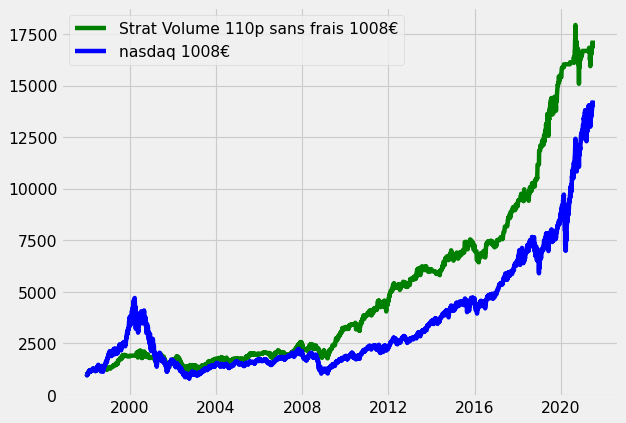

In [21]:
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(df['Date'], df[portefeuille], color="g", label="Strat Volume 110p sans frais 1008€")
#plt.plot(df['Date'], df[portefeuille_frais], color="r", label="Strat Volume 110p avec frais 1008€")
plt.plot(df['Date'], df.Close, color="b", label="nasdaq 1008€")
plt.legend(loc="upper left")
plt.show()

In [22]:
model_volume.stats(portefeuille, portefeuille_frais)

Départ : 1008€

Stratégie sans frais final : 17181€
Stratégie avec frais final: 0€
Sans stratégie final: 14270€

Total frais: 3665€
Total transactions: 1466


<h1>Partie 4 : Relative Strenght Index (RSI)</h1>

In [23]:
#on créé les columns (différentes pour chaque modèle)
indicator, activity, portefeuille, portefeuille_frais = "RSI100_indicator", "RSI100_activity", "RSI100_pf", "RSI100_pf_frais"
df[indicator], df[activity], df[portefeuille], df[portefeuille_frais] = 0,0,0,0

In [24]:
#indicateur RSI100

delta = df.Close.diff()

# Make the positive gains (up) and negative gains (down) Series
up, down = delta.clip(lower=0), delta.clip(upper=0)

# Calculate the SMA
roll_up2 = up.rolling(window=10).mean()
roll_down2 = down.abs().rolling(window=10).mean()

# Calculate the RSI based on SMA
RS2 = roll_up2 / roll_down2
RSI2 = 100.0 - (100.0 / (1.0 + RS2))

df[indicator] = RSI2

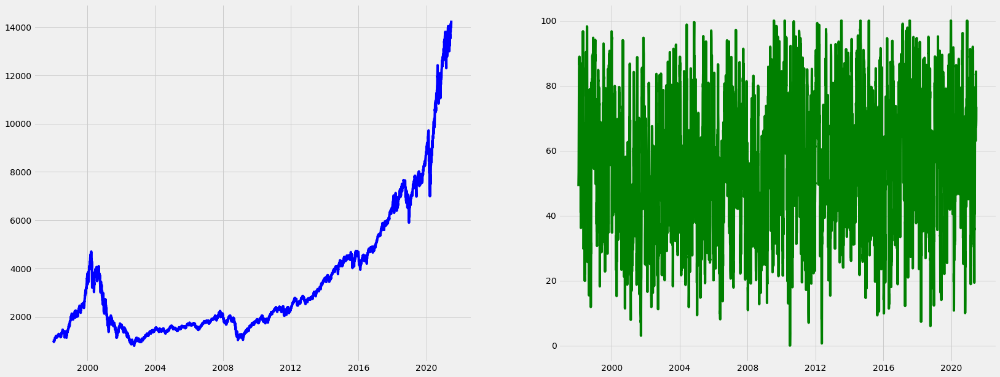

In [622]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(25, 10))
ax1.plot(df.Date, df.Close, color="b")
ax2.plot(df.Date, df[indicator], color="g")
plt.show()

In [25]:
model_rsi100 = RSIModel(df, indicator, activity, portefeuille, portefeuille_frais, frais = 2.5,rsi_sell_sup=90, rsi_buy_inf=78)

1998-07-20 00:00:00 || GO SELL || 136 || 1465.8900146484375 || 1465.8900146484375 || 1463.3900146484375
1998-07-30 00:00:00 || GO BUY || 144 || 1422.050048828125|| 1465.8900146484375 || 1460.8900146484375

1999-12-30 00:00:00 || GO SELL || 502 || 3683.669921875 || 3797.2327065332397 || 3781.780736506199
2000-01-07 00:00:00 || GO BUY || 508 || 3529.60009765625|| 3797.2327065332397 || 3779.280736506199

2001-11-14 00:00:00 || GO SELL || 972 || 1585.8900146484375 || 1706.1404312024702 || 1695.5744041111761
2001-11-21 00:00:00 || GO BUY || 977 || 1552.010009765625|| 1706.1404312024702 || 1693.0744041111761

2003-08-22 00:00:00 || GO SELL || 1417 || 1304.5400390625 || 1434.0941686987549 || 1420.6115362512742
2003-09-11 00:00:00 || GO BUY || 1430 || 1350.800048828125|| 1434.0941686987549 || 1418.1115362512742

2004-06-02 00:00:00 || GO SELL || 1612 || 1464.219970703125 || 1554.5078810881762 || 1534.683266957231
2004-06-04 00:00:00 || GO BUY || 1614 || 1455.0400390625|| 1554.5078810881762 || 

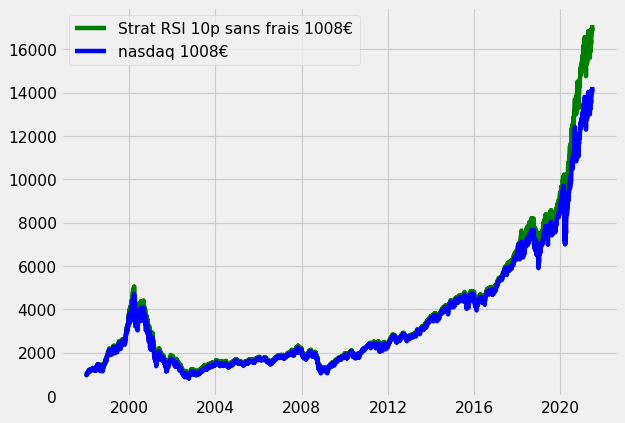

In [624]:
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(df['Date'], df[portefeuille], color="g", label="Strat RSI 10p sans frais 1008€")
#plt.plot(df['Date'], df[portefeuille_frais], color="r", label="Strat RSI 10p avec frais 1008€")
plt.plot(df['Date'], df.Close, color="b", label="nasdaq 1008€")
plt.legend(loc="upper left")
plt.show()

In [625]:
model_rsi100.stats(portefeuille, portefeuille_frais)

Départ : 1008€

Stratégie sans frais final : 17131€
Stratégie avec frais final: 15988€
Sans stratégie final: 14270€

Total frais: 180€
Total transactions: 72


<h1>Partie 5 : Bollinger Band</h1>

In [626]:
#on créé les columns (différentes pour chaque modèle)
indicator, activity, portefeuille, portefeuille_frais = "BB_indicator", "BB_activity", "BB_pf", "BB_pf_frais"
df[indicator], df[activity], df[portefeuille], df[portefeuille_frais] = 0,0,0,0

In [627]:
#indicateur BB100
df_test = df

# Calculate 30 Day Moving Average, Std Deviation, Upper Band and Lower Band
df_test['100 Day MA'] = df_test.Close.rolling(window=100).mean()
    
# set .std(ddof=0) for population std instead of sample
df_test['100 Day STD'] = df_test.Close.rolling(window=100).std()

df_test['Upper Band'] = df_test['100 Day MA'] + (df_test['100 Day STD'] * 2)
df_test['Lower Band'] = df_test['100 Day MA'] - (df_test['100 Day STD'] * 2)

df[indicator] = df_test[['100 Day MA', 'Upper Band', 'Lower Band']]

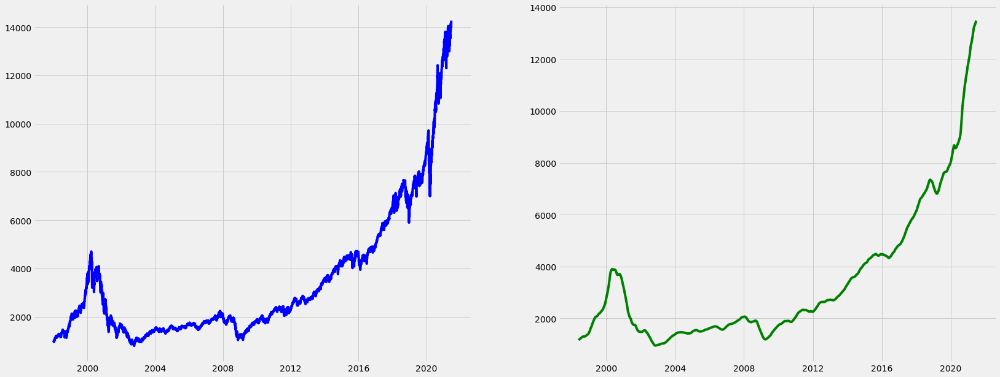

In [628]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(25, 10))
ax1.plot(df.Date, df.Close, color="b")
ax2.plot(df.Date, df[indicator], color="g")
plt.show()

In [629]:
# “buy signal” if a security's RSI reading moves below 30, based on the idea that the security has been oversold and is therefore poised for a rebound
model_bb = BasicModel(df, indicator, activity, portefeuille, portefeuille_frais, frais = 2.5)

1998-08-31 00:00:00 || GO SELL || 166 || 1140.3399658203125 || 1140.3399658203125 || 1137.8399658203125
1998-09-01 00:00:00 || GO BUY || 167 || 1215.06005859375|| 1140.3399658203125 || 1135.3399658203125

1998-09-03 00:00:00 || GO SELL || 169 || 1208.9599609375 || 1134.6149935412636 || 1127.1400955829822
1998-09-08 00:00:00 || GO BUY || 171 || 1286.469970703125|| 1134.6149935412636 || 1124.6400955829822

1998-09-10 00:00:00 || GO SELL || 173 || 1235.3699951171875 || 1089.54686152905 || 1077.4681772825134
1998-09-11 00:00:00 || GO BUY || 174 || 1290.199951171875|| 1089.54686152905 || 1074.9681772825134

1998-10-05 00:00:00 || GO SELL || 190 || 1207.6800537109375 || 1019.8605348394547 || 1003.714288644901
1998-10-12 00:00:00 || GO BUY || 195 || 1243.4000244140625|| 1019.8605348394547 || 1001.214288644901

1998-10-13 00:00:00 || GO SELL || 196 || 1206.9000244140625 || 989.922535168607 || 969.3236494153739
1998-10-14 00:00:00 || GO BUY || 197 || 1235.6700439453125|| 989.922535168607 || 966

2004-09-23 00:00:00 || GO BUY || 1690 || 1405.77001953125|| 1475.0787812037406 || 1287.1959379256987

2004-09-24 00:00:00 || GO SELL || 1691 || 1399.050048828125 || 1468.0274953911469 || 1278.5427842292452
2004-09-30 00:00:00 || GO BUY || 1695 || 1412.739990234375|| 1468.0274953911469 || 1276.0427842292452

2004-10-19 00:00:00 || GO SELL || 1708 || 1443.800048828125 || 1500.3030877430847 || 1301.5974609002983
2004-10-21 00:00:00 || GO BUY || 1710 || 1474.7900390625|| 1500.3030877430847 || 1299.0974609002983

2004-10-22 00:00:00 || GO SELL || 1711 || 1438.25 || 1463.1309262965844 || 1264.4104575235554
2004-10-27 00:00:00 || GO BUY || 1714 || 1480.030029296875|| 1463.1309262965844 || 1261.9104575235554

2004-10-28 00:00:00 || GO SELL || 1715 || 1487.1199951171875 || 1470.1399383117077 || 1265.4555389307127
2004-11-01 00:00:00 || GO BUY || 1717 || 1488.7900390625|| 1470.1399383117077 || 1262.9555389307127

2005-03-22 00:00:00 || GO SELL || 1814 || 1465.0899658203125 || 1446.7367563316661 

2015-07-09 00:00:00 || GO SELL || 4406 || 4352.02978515625 || 2978.275670567884 || 2247.477237844317
2015-07-10 00:00:00 || GO BUY || 4407 || 4420.14990234375|| 2978.275670567884 || 2244.977237844317

2015-08-21 00:00:00 || GO SELL || 4437 || 4197.27001953125 || 2828.100281247373 || 2129.2773973995036
2015-10-23 00:00:00 || GO BUY || 4481 || 4624.08984375|| 2828.100281247373 || 2126.7773973995036

2015-11-13 00:00:00 || GO SELL || 4496 || 4502.14013671875 || 2753.515657590186 || 2068.188547637185
2015-11-16 00:00:00 || GO BUY || 4497 || 4565.47021484375|| 2753.515657590186 || 2065.688547637185

2015-12-09 00:00:00 || GO SELL || 4513 || 4622.14013671875 || 2787.6942875788095 || 2088.829369524945
2015-12-15 00:00:00 || GO BUY || 4517 || 4597.330078125|| 2787.6942875788095 || 2086.329369524945

2015-12-18 00:00:00 || GO SELL || 4520 || 4514.830078125 || 2737.668560729314 || 2046.3897752254625
2015-12-22 00:00:00 || GO BUY || 4522 || 4589.259765625|| 2737.668560729314 || 2043.8897752254625

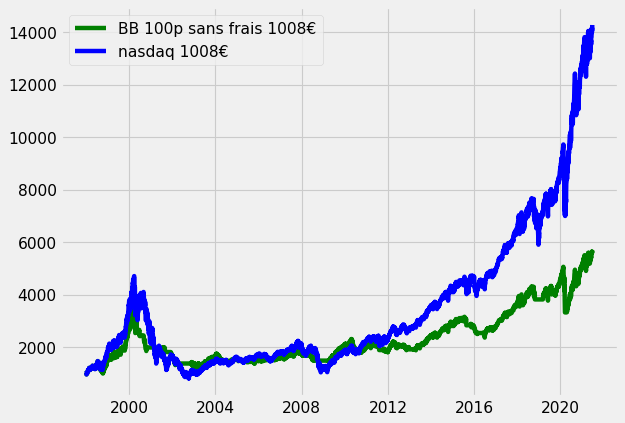

In [630]:
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(df['Date'], df[portefeuille], color="g", label="BB 100p sans frais 1008€")
#plt.plot(df['Date'], df[portefeuille_frais], color="r", label="BB 100p avec frais 1008€")
plt.plot(df['Date'], df.Close, color="b", label="nasdaq 1008€")
plt.legend(loc="upper left")
plt.show()

<h1>Partie 5 : Moyenne mobile VIX</h1>

In [26]:
#chargement dataset VIX
start_date = '1998-01-01'
end_date = datetime.now()
df_vix = pdr.DataReader('^VIX', 'yahoo', start_date, end_date)

#on passe l'index Date en colomne
df_vix = df_vix.rename_axis('Date').reset_index()

len(df), len(df_vix)

(5906, 5906)

In [27]:
#on créé les columns (différentes pour chaque modèle)
indicator, activity, portefeuille, portefeuille_frais = "VIX_indicator", "VIX_acivity", "VIX_pf", "VIX_pf_frais"
df[indicator], df[activity], df[portefeuille], df[portefeuille_frais] = 0,0,0,0

In [28]:
#indicateur VIX100
df[indicator] = df_vix.Close.rolling(window=100).mean()

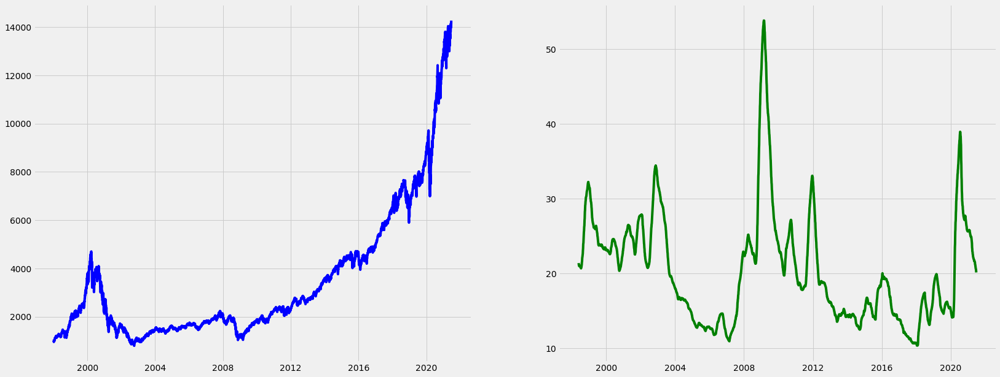

In [634]:

fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(25, 10))
ax1.plot(df.Date, df.Close, color="b")
ax2.plot(df.Date, df[indicator], color="g")
plt.show()

In [29]:
model_vix100 = BasicModel(df, indicator, activity, portefeuille, portefeuille_frais, frais = 2.5)


1998-05-28 00:00:00 || GO SELL || 100 || 1214.8299560546875 || 1214.8299560546875 || 1212.3299560546875
1998-06-11 00:00:00 || GO BUY || 110 || 1185.1099853515625|| 1214.8299560546875 || 1209.8299560546875

1998-06-17 00:00:00 || GO SELL || 114 || 1224.0799560546875 || 1254.7772085307402 || 1247.112793534728
1998-07-21 00:00:00 || GO BUY || 137 || 1431.8900146484375|| 1254.7772085307402 || 1244.612793534728

1998-12-22 00:00:00 || GO SELL || 245 || 1767.8199462890625 || 1549.1554202465588 || 1534.1063729115795
1999-01-13 00:00:00 || GO BUY || 259 || 1948.7099609375|| 1549.1554202465588 || 1531.6063729115795

1999-01-14 00:00:00 || GO SELL || 260 || 1906.1199951171875 || 1515.297905418179 || 1495.6324007042967
1999-04-19 00:00:00 || GO BUY || 324 || 1967.5799560546875|| 1515.297905418179 || 1493.1324007042967

1999-04-26 00:00:00 || GO SELL || 329 || 2260.659912109375 || 1741.0083992474708 || 1713.0412421013789
1999-05-04 00:00:00 || GO BUY || 335 || 2097.550048828125|| 1741.00839924747

2001-06-15 00:00:00 || GO BUY || 870 || 1701.530029296875|| 1293.2337645626144 || 1139.1173723139134

2001-06-19 00:00:00 || GO SELL || 872 || 1675.9000244140625 || 1273.7538922537758 || 1119.4589423645068
2001-07-09 00:00:00 || GO BUY || 885 || 1697.050048828125|| 1273.7538922537758 || 1116.9589423645068

2001-07-12 00:00:00 || GO SELL || 888 || 1750.1300048828125 || 1313.594084752521 || 1149.3949371022804
2001-09-05 00:00:00 || GO BUY || 926 || 1415.300048828125|| 1313.594084752521 || 1146.8949371022804

2001-12-05 00:00:00 || GO SELL || 986 || 1720.9100341796875 || 1597.2423961699603 || 1392.047401481001
2001-12-07 00:00:00 || GO BUY || 988 || 1673.9000244140625|| 1597.2423961699603 || 1389.547401481001

2001-12-18 00:00:00 || GO SELL || 995 || 1657.6800537109375 || 1581.7652323645923 || 1373.5827872185603
2001-12-24 00:00:00 || GO BUY || 999 || 1577.31005859375|| 1581.7652323645923 || 1371.0827872185603

2001-12-26 00:00:00 || GO SELL || 1000 || 1590.8399658203125 || 1595.333355341

2006-04-07 00:00:00 || GO BUY || 2078 || 1723.030029296875|| 1935.1813851569011 || 1429.9694211835672

2006-04-24 00:00:00 || GO SELL || 2088 || 1706.43994140625 || 1916.548611079739 || 1413.7010492022491
2006-04-27 00:00:00 || GO BUY || 2091 || 1717.1400146484375|| 1916.548611079739 || 1411.2010492022491

2006-05-03 00:00:00 || GO SELL || 2095 || 1686.300048828125 || 1882.127251636451 || 1383.3557705693377
2006-05-08 00:00:00 || GO BUY || 2098 || 1715.22998046875|| 1882.127251636451 || 1380.8557705693377

2006-06-29 00:00:00 || GO SELL || 2135 || 1585.56005859375 || 1739.8400385760715 || 1273.9642534379527
2006-07-03 00:00:00 || GO BUY || 2137 || 1586.25|| 1739.8400385760715 || 1271.4642534379527

2006-08-30 00:00:00 || GO SELL || 2178 || 1581.949951171875 || 1735.1236337729172 || 1265.517534211476
2006-08-31 00:00:00 || GO BUY || 2179 || 1579.72998046875|| 1735.1236337729172 || 1263.017534211476

2006-09-01 00:00:00 || GO SELL || 2180 || 1589.469970703125 || 1745.8217198112454 || 126

2012-11-09 00:00:00 || GO BUY || 3738 || 2584.10009765625|| 1461.7934065771044 || 855.3744924238244

2012-11-12 00:00:00 || GO SELL || 3739 || 2582.77001953125 || 1461.040997862318 || 852.4342173346017
2012-12-12 00:00:00 || GO BUY || 3760 || 2674.570068359375|| 1461.040997862318 || 849.9342173346017

2012-12-14 00:00:00 || GO SELL || 3762 || 2628.090087890625 || 1435.6503162540623 || 832.6636468086003
2012-12-20 00:00:00 || GO BUY || 3766 || 2693.550048828125|| 1435.6503162540623 || 830.1636468086003

2012-12-21 00:00:00 || GO SELL || 3767 || 2664.669921875 || 1420.2573357480012 || 818.762668145838
2012-12-26 00:00:00 || GO BUY || 3769 || 2637.179931640625|| 1420.2573357480012 || 816.262668145838

2013-01-02 00:00:00 || GO SELL || 3773 || 2746.469970703125 || 1479.1156555161697 || 847.5902344095555
2013-01-14 00:00:00 || GO BUY || 3781 || 2735.699951171875|| 1479.1156555161697 || 845.0902344095555

2013-01-15 00:00:00 || GO SELL || 3782 || 2722.97998046875 || 1472.2383268103517 || 838

2015-10-28 00:00:00 || GO SELL || 4484 || 4678.580078125 || 2445.4018293779395 || 1110.2123031120207
2015-10-29 00:00:00 || GO BUY || 4485 || 4670.759765625|| 2445.4018293779395 || 1107.7123031120207

2015-11-06 00:00:00 || GO SELL || 4491 || 4707.22998046875 || 2464.4960098907277 || 1113.861539576049
2015-11-09 00:00:00 || GO BUY || 4492 || 4655.52001953125|| 2464.4960098907277 || 1111.361539576049

2015-11-18 00:00:00 || GO SELL || 4499 || 4653.43994140625 || 2463.3948774247915 || 1108.3649852023718
2015-12-02 00:00:00 || GO BUY || 4508 || 4686.22021484375|| 2463.3948774247915 || 1105.8649852023718

2016-01-14 00:00:00 || GO SELL || 4537 || 4272.97021484375 || 2246.1626761143943 || 1005.8453032020842
2016-01-21 00:00:00 || GO BUY || 4541 || 4142.60009765625|| 2246.1626761143943 || 1003.3453032020842

2016-01-22 00:00:00 || GO SELL || 4542 || 4259.77001953125 || 2309.6934778028713 || 1029.2240720956468
2016-02-08 00:00:00 || GO BUY || 4553 || 3960.669921875|| 2309.6934778028713 || 102

2019-03-01 00:00:00 || GO SELL || 5323 || 7151.56982421875 || 3311.9409537022743 || 1264.3603497440963
2019-06-26 00:00:00 || GO BUY || 5404 || 7627.0498046875|| 3311.9409537022743 || 1261.8603497440963

2019-06-28 00:00:00 || GO SELL || 5406 || 7671.080078125 || 3331.0604913393227 || 1266.6449561990098
2019-07-17 00:00:00 || GO BUY || 5418 || 7888.759765625|| 3331.0604913393227 || 1264.1449561990098

2019-07-18 00:00:00 || GO SELL || 5419 || 7904.1298828125 || 3337.5505850462746 || 1264.1079613729576
2019-07-31 00:00:00 || GO BUY || 5428 || 7848.77978515625|| 3337.5505850462746 || 1261.6079613729576

2019-09-27 00:00:00 || GO SELL || 5469 || 7681.580078125 || 3266.4519563043787 || 1232.2323848752212
2019-10-02 00:00:00 || GO BUY || 5472 || 7550.7900390625|| 3266.4519563043787 || 1229.7323848752212

2019-10-03 00:00:00 || GO SELL || 5473 || 7638.39013671875 || 3304.3475286724906 || 1241.4990611367555
2019-10-07 00:00:00 || GO BUY || 5475 || 7725.1298828125|| 3304.3475286724906 || 1238.

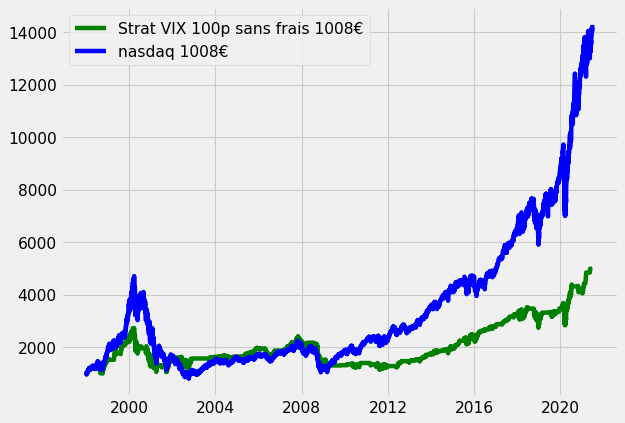

In [636]:
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(df['Date'], df[portefeuille], color="g", label="Strat VIX 100p sans frais 1008€")
#plt.plot(df['Date'], df[portefeuille_frais], color="r", label="Strat VIX 100p avec frais 1008€")
plt.plot(df['Date'], df.Close, color="b", label="nasdaq 1008€")
plt.legend(loc="upper left")
plt.show()

In [30]:
model_vix100.stats(portefeuille, portefeuille_frais)

Départ : 1008€

Stratégie sans frais final : 4984€
Stratégie avec frais final: 1766€
Sans stratégie final: 14270€

Total frais: 1237€
Total transactions: 495


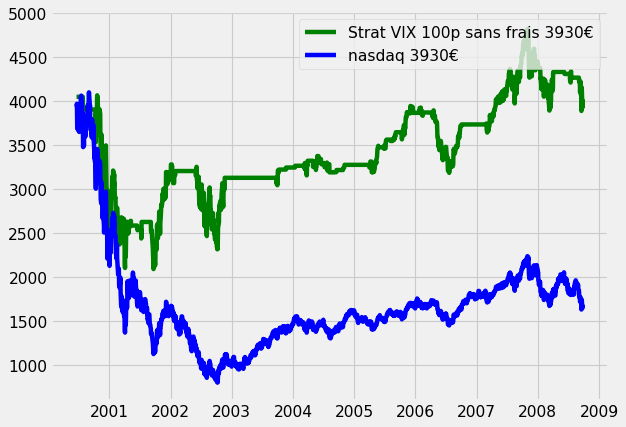

In [638]:
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(df['Date'][620:2700], df[portefeuille][620:2700]*2, color="g", label="Strat VIX 100p sans frais 3930€")
#plt.plot(df['Date'][620:2700], df[portefeuille_frais][620:2700]*2, color="r", label="Strat VIX 100p avec frais 3930€")
plt.plot(df['Date'][620:2700], df.Close[620:2700], color="b", label="nasdaq 3930€")
plt.legend(loc="upper right")
plt.show()


<h1>Partie 6 : Créer un modèle à partir de tout les indicateurs</h1>

In [31]:
#on créé les columns (différentes pour chaque modèle)
indicator, activity, portefeuille, portefeuille_frais = "supermodel_indicator", "supermodel_acivity", "supermodel_pf", "supermodel_pf_frais"
df[indicator], df[activity], df[portefeuille], df[portefeuille_frais] = 0,0,0,0

In [32]:
#indicateur supermodel (somme des activities)
df[indicator] = df.MM_acivity + df.GAFA_acivity + df.VIX_acivity + df.RSI100_activity + df.vol_acivity


In [33]:
df.columns

Index(['Date', 'High', 'Low', 'Open', 'Close', 'Volume', 'MM_indicator',
       'MM_acivity', 'MM_pf', 'MM_pf_frais', 'GAFA_indicator', 'GAFA_acivity',
       'GAFA_pf', 'GAFA_pf_frais', 'AAPL', 'MSFT', 'AMZN', 'vol_indicator',
       'vol_acivity', 'vol_pf', 'vol_pf_frais', 'RSI100_indicator',
       'RSI100_activity', 'RSI100_pf', 'RSI100_pf_frais', 'VIX_indicator',
       'VIX_acivity', 'VIX_pf', 'VIX_pf_frais', 'supermodel_indicator',
       'supermodel_acivity', 'supermodel_pf', 'supermodel_pf_frais'],
      dtype='object')

In [34]:
supermodel = SuperModel(df, indicator, activity, portefeuille, portefeuille_frais, frais = 2.5,buy_signal=4, sell_signal=2)

1999-11-03 00:00:00 || GO SELL || 463 || 2672.719970703125 || 2672.719970703125 || 2670.219970703125
1999-11-22 00:00:00 || GO BUY || 476 || 3049.610107421875|| 2672.719970703125 || 2667.719970703125

1999-12-30 00:00:00 || GO SELL || 502 || 3683.669921875 || 3228.418656441625 || 3219.8790812301754
2000-01-07 00:00:00 || GO BUY || 508 || 3529.60009765625|| 3228.418656441625 || 3217.3790812301754

2000-02-18 00:00:00 || GO SELL || 537 || 3965.75 || 3627.351805459484 || 3612.4480786395898
2000-02-25 00:00:00 || GO BUY || 541 || 4178.580078125|| 3627.351805459484 || 3609.9480786395898

2000-05-24 00:00:00 || GO SELL || 603 || 3180.31005859375 || 2760.77117520204 || 2745.0252288692004
2000-05-25 00:00:00 || GO BUY || 604 || 3099.280029296875|| 2760.77117520204 || 2742.5252288692004

2000-05-31 00:00:00 || GO SELL || 607 || 3324.080078125 || 2961.018164542173 || 2938.9487851578615
2000-06-09 00:00:00 || GO BUY || 614 || 3760.260009765625|| 2961.018164542173 || 2936.4487851578615

2000-06-20


2010-03-17 00:00:00 || GO SELL || 3069 || 1936.219970703125 || 5536.000671967643 || 5202.260966301197
2010-03-29 00:00:00 || GO BUY || 3077 || 1961.219970703125|| 5536.000671967643 || 5199.760966301197

2010-07-01 00:00:00 || GO SELL || 3143 || 1734.4100341796875 || 4895.776740048101 || 4595.922272875083
2010-07-07 00:00:00 || GO BUY || 3146 || 1789.719970703125|| 4895.776740048101 || 4593.422272875083

2010-08-19 00:00:00 || GO SELL || 3177 || 1823.0 || 4986.814218540196 || 4676.337438552731
2010-09-01 00:00:00 || GO BUY || 3186 || 1820.050048828125|| 4986.814218540196 || 4673.837438552731

2010-11-04 00:00:00 || GO SELL || 3231 || 2187.800048828125 || 5994.424382913945 || 5615.709116207664
2010-11-18 00:00:00 || GO BUY || 3241 || 2134.77001953125|| 5994.424382913945 || 5613.209116207664

2011-01-20 00:00:00 || GO SELL || 3283 || 2286.080078125 || 6419.30233056925 || 6008.56696155011
2011-01-26 00:00:00 || GO BUY || 3287 || 2314.18994140625|| 6419.30233056925 || 6006.06696155011

201

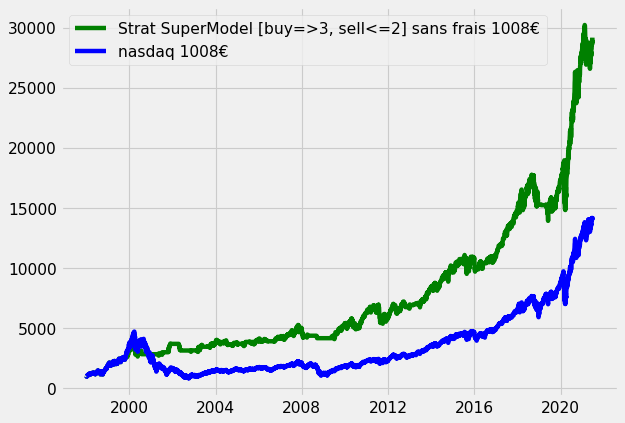

In [643]:
plt.figure(figsize=(8, 6), dpi=80)
plt.plot(df['Date'], df[portefeuille], color="g", label="Strat SuperModel [buy=>3, sell<=2] sans frais 1008€")
#plt.plot(df['Date'], df[portefeuille_frais], color="r", label="Strat SuperModel [buy=>3, sell<=2] avec frais 1008€")
plt.plot(df['Date'], df.Close, color="b", label="nasdaq 1008€")
plt.legend(loc="upper left")
plt.show()

In [644]:
supermodel.stats(portefeuille, portefeuille_frais)

Départ : 1008€

Stratégie sans frais final : 29163€
Stratégie avec frais final: 26837€
Sans stratégie final: 14270€

Total frais: 395€
Total transactions: 158


In [645]:
df[600:650]

,Date,High,Low,Open,Close,Volume,MM_indicator,MM_acivity,MM_pf,MM_pf_frais,GAFA_indicator,GAFA_acivity,GAFA_pf,GAFA_pf_frais,AAPL,MSFT,AMZN,vol_indicator,vol_acivity,vol_pf,vol_pf_frais,RSI100_indicator,RSI100_activity,RSI100_pf,RSI100_pf_frais,BB_indicator,BB_activity,BB_pf,BB_pf_frais,100 Day MA,100 Day STD,Upper Band,Lower Band,VIX_indicator,VIX_acivity,VIX_pf,VIX_pf_frais,supermodel_indicator,supermodel_acivity,supermodel_pf,supermodel_pf_frais
600,2000-05-19,3425.379883,3259.179932,3425.379883,3260.639893,1366930000,3585.818400,1,3072.846964,3059.236806,0.204206,0,3652.292659,3624.160622,0.007162,0.176820,0.020224,1.680143e+09,1,1818.335934,1487.619563,32.641789,1,3507.878542,3491.294536,3898.082290,0,2591.060524,2510.206552,3898.082290,381.042450,4660.167190,3135.997390,24.5478,1,1886.751919,1741.641019,4,1,2830.504090,2816.923571
601,2000-05-22,3269.540039,3029.139893,3261.469971,3264.709961,1615480000,3591.835732,1,3076.682621,3063.055475,0.203874,0,3652.292659,3624.160622,0.007169,0.176522,0.020182,1.680316e+09,0,1820.605658,1486.976473,37.988492,1,3512.257224,3495.652517,3893.832590,0,2591.060524,2510.206552,3893.832590,385.731163,4665.294916,3122.370264,24.5769,1,1889.107042,1743.815008,3,1,2834.037245,2820.439774
602,2000-05-23,3298.459961,3022.520020,3262.770020,3023.419922,1330440000,3596.243532,1,2849.289414,2836.669430,0.203534,0,3652.292659,3624.160622,0.007177,0.176232,0.020125,1.677426e+09,1,1820.605658,1484.476473,32.911769,1,3252.671321,3237.293844,3887.230090,0,2591.060524,2510.206552,3887.230090,394.906395,4677.042881,3097.417300,24.5880,1,1749.485845,1614.932138,4,1,2624.577609,2611.985108
603,2000-05-24,3185.739990,2897.270020,3023.489990,3180.310059,2087980000,3601.003665,1,2997.143638,2983.868783,0.203144,0,3652.292659,3624.160622,0.007182,0.175897,0.020064,1.683405e+09,0,1915.079822,1559.008352,47.294781,1,3421.457683,3405.282244,3881.954890,0,2591.060524,2510.206552,3881.954890,400.806307,4683.567503,3080.342277,24.5848,0,1840.269488,1696.233571,2,0,2760.771175,2745.025229
604,2000-05-25,3290.530029,3078.179932,3181.500000,3099.280029,1561840000,3605.151266,1,2920.780443,2907.843813,0.202685,0,3652.292659,3624.160622,0.007187,0.175501,0.019997,1.683306e+09,1,1915.079822,1556.508352,37.562673,1,3334.283536,3318.520225,3875.042190,0,2591.060524,2510.206552,3875.042190,408.289984,4691.622158,3058.462222,24.5885,1,1840.269488,1693.733571,4,1,2760.771175,2742.525229
605,2000-05-26,3170.719971,3033.500000,3100.969971,3101.439941,1069440000,3609.254867,1,2922.815957,2909.870312,0.202238,0,3652.292659,3624.160622,0.007193,0.175109,0.019936,1.680988e+09,1,1916.414456,1557.593094,36.298579,1,3336.607224,3320.832928,3870.594590,0,2591.060524,2510.206552,3870.594590,414.286724,4699.168038,3042.021141,24.5631,0,1841.551986,1692.413947,3,1,2762.695178,2744.436516
606,2000-05-30,3415.709961,3101.429932,3101.429932,3414.030029,1457360000,3615.453800,1,3217.402766,3203.152347,0.201820,0,3652.292659,3624.160622,0.007198,0.174744,0.019877,1.680719e+09,1,2109.567370,1714.580872,46.282198,1,3672.899515,3655.535349,3869.661790,0,2591.060524,2510.206552,3869.661790,415.216921,4700.095631,3039.227948,24.5352,0,1841.551986,1692.413947,3,1,3041.143623,3021.044694
607,2000-05-31,3458.340088,3322.219971,3414.030029,3324.080078,1533730000,3621.171668,1,3132.633383,3118.758421,0.201387,0,3652.292659,3624.160622,0.007202,0.174369,0.019815,1.681266e+09,0,2053.986288,1666.906557,37.333144,1,3576.129092,3559.222421,3869.494490,0,2591.060524,2510.206552,3869.494490,415.435472,4700.365433,3038.623546,24.5144,0,1841.551986,1692.413947,2,0,2961.018165,2938.948785
608,2000-06-01,3526.530029,3331.800049,3331.800049,3518.979980,1580240000,3628.248468,1,3316.308242,3301.619753,0.201013,0,3652.292659,3624.160622,0.007208,0.174039,0.019766,1.684062e+09,0,2053.986288,1666.906557,48.851931,1,3785.807317,3767.909362,3869.388289,0,2591.060524,2510.206552,3869.388289,415.524587,4700.437463,3038.339114,24.5208,1,1841.551986,1689.913947,3,0,2961.01

<h1>Visualisation finale</h1>

In [646]:
# compression_opts = dict(method='zip',
#                         archive_name='data_market_final.csv')  
# df.to_csv('data_market_final.zip', index=False,
#           compression=compression_opts)

In [37]:
df

,Date,High,Low,Open,Close,Volume,MM_indicator,MM_acivity,MM_pf,MM_pf_frais,GAFA_indicator,GAFA_acivity,GAFA_pf,GAFA_pf_frais,AAPL,MSFT,AMZN,vol_indicator,vol_acivity,vol_pf,vol_pf_frais,RSI100_indicator,RSI100_activity,RSI100_pf,RSI100_pf_frais,VIX_indicator,VIX_acivity,VIX_pf,VIX_pf_frais,supermodel_indicator,supermodel_acivity,supermodel_pf,supermodel_pf_frais
0,1998-01-02,1008.229980,987.719971,990.799988,1008.229980,434140000,NaN,1,1008.229980,1008.229980,NaN,1,1008.229980,1008.229980,NaN,NaN,NaN,NaN,1,1008.229980,1008.229980,NaN,1,1008.229980,1008.229980,NaN,1,1008.229980,1008.229980,5,1,1008.229980,1008.229980
1,1998-01-05,1028.619995,1007.250000,1008.229980,1017.419983,681560000,NaN,1,1017.419983,1017.419983,NaN,1,1017.419983,1017.419983,NaN,NaN,NaN,NaN,1,1017.419983,1017.419983,NaN,1,1017.419983,1017.419983,NaN,1,1017.419983,1017.419983,5,1,1017.419983,1017.419983
2,1998-01-06,1018.219971,1001.940002,1017.419983,1006.289978,635700000,NaN,1,1006.289978,1006.289978,NaN,1,1006.289978,1006.289978,NaN,NaN,NaN,NaN,1,1006.289978,1006.289978,NaN,1,1006.289978,1006.289978,NaN,1,1006.289978,1006.289978,5,1,1006.289978,1006.289978
3,1998-01-07,1006.289978,978.700012,1006.289978,991.190002,691340000,NaN,1,991.190002,991.190002,NaN,1,991.190002,991.190002,NaN,NaN,NaN,NaN,1,991.190002,991.190002,NaN,1,991.190002,991.190002,NaN,1,991.190002,991.190002,5,1,991.190002,991.190002
4,1998-01-08,1003.710022,982.270020,990.969971,994.549988,645050000,NaN,1,994.549988,994.549988,NaN,1,994.549988,994.549988,NaN,NaN,NaN,NaN,1,994.549988,994.549988,NaN,1,994.549988,994.549988,NaN,1,994.549988,994.549988,5,1,994.549988,994.549988
5,1998-01-09,995.510010,950.140015,994.539978,956.190002,813460000,NaN,1,956.190002,956.190002,NaN,1,956.190002,956.190002,NaN,NaN,NaN,NaN,1,956.190002,956.190002,NaN,1,956.190002,956.190002,NaN,1,956.190002,956.190002,5,1,956.190002,956.190002
6,1998-01-12,971.320007,933.010010,956.190002,971.169983,698330000,NaN,1,971.169983,971.169983,NaN,1,971.169983,971.169983,NaN,NaN,NaN,NaN,1,971.169983,971.169983,NaN,1,971.169983,971.169983,NaN,1,971.169983,971.169983,5,1,971.169983,971.169983
7,1998-01-13,995.049988,971.169983,971.169983,995.049988,742030000,NaN,1,995.049988,995.049988,NaN,1,995.049988,995.049988,NaN,NaN,NaN,NaN,1,995.049988,995.049988,NaN,1,995.049988,995.049988,NaN,1,995.049988,995.049988,5,1,995.049988,995.049988
8,1998-01-14,1001.940002,983.900024,995.049988,996.369995,691680000,NaN,1,996.369995,996.369995,NaN,1,996.369995,996.369995,NaN,NaN,NaN,NaN,1,996.369995,996.369995,NaN,1,996.369995,996.369995,NaN,1,996.369995,996.369995,5,1,996.369995,996.369995
9,1998-01-15,1004.359985,986.979980,996.369995,995.580017,659450000,NaN,1,995.580017,995.580017,NaN,1,995.580017,995.580017,NaN,NaN,NaN,NaN,1,995.580017,995.580017,NaN,1,995.580017,995.580017,NaN,1,995.580017,995.580017,5,1,995.580017,995.580017


In [35]:
df.RSI100_indicator.values[-1]

73.48527419923124

In [36]:
df.VIX_indicator.values[-1]

20.13629997253418

In [649]:
df.columns

Index(['Date', 'High', 'Low', 'Open', 'Close', 'Volume', 'MM_indicator',
       'MM_acivity', 'MM_pf', 'MM_pf_frais', 'GAFA_indicator', 'GAFA_acivity',
       'GAFA_pf', 'GAFA_pf_frais', 'AAPL', 'MSFT', 'AMZN', 'vol_indicator',
       'vol_acivity', 'vol_pf', 'vol_pf_frais', 'RSI100_indicator',
       'RSI100_activity', 'RSI100_pf', 'RSI100_pf_frais', 'BB_indicator',
       'BB_activity', 'BB_pf', 'BB_pf_frais', '100 Day MA', '100 Day STD',
       'Upper Band', 'Lower Band', 'VIX_indicator', 'VIX_acivity', 'VIX_pf',
       'VIX_pf_frais', 'supermodel_indicator', 'supermodel_acivity',
       'supermodel_pf', 'supermodel_pf_frais'],
      dtype='object')

In [38]:
compression_opts = dict(method='zip',
                        archive_name='data_market_final.csv')  
df.to_csv('data_market_final.zip', index=False,
          compression=compression_opts)